In [ ]:
# !conda install -c pyviz hvplot

In [81]:
import pandas as pd
import numpy as np
import hvplot.pandas
import holoviews as hv
from hvplot.sample_data import us_crime, airline_flights

# flights = airline_flights.to_dask().persist()
# print(type(flights))
# flights.head()

%matplotlib inline

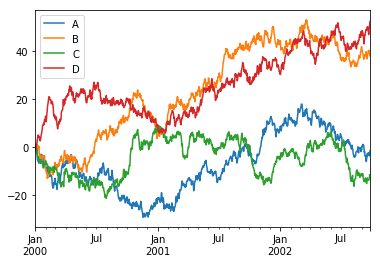

In [54]:
idx = pd.date_range('1/1/2000', periods=1000)
df  = pd.DataFrame(np.random.randn(1000, 4), index=idx, columns=list('ABCD')).cumsum()
df.plot()

In [56]:
from hvplot import hvPlot
df.reset_index(inplace=True)

plot = hvPlot(df)
plot(y='A')

:Curve   [index]   (A)

In [57]:
df.hvplot.line()

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [58]:
# Histogramas

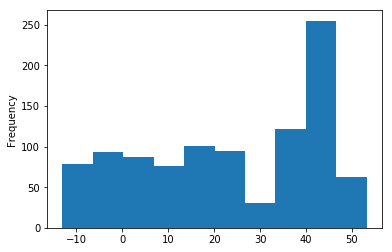

In [59]:
df['B'].plot.hist()

In [ ]:
# subplots

In [67]:
us_crime.hvplot(x='Year', y=['Burglary rate', 'Violent Crime rate', 'Robbery rate'],
                value_label='Rate', subplots=True, width=300, height=200)

:NdLayout   [Variable]
   :Curve   [Year]   (Rate)

In [68]:
us_crime.hvplot(x='Year', y=['Robbery',  'Robbery rate', 'Burglary', 'Burglary rate'], 
                width=350, height=300, subplots=True, shared_axes=False).cols(2)

:NdLayout   [Variable]
   :Curve   [Year]   (value)

In [70]:
# flights = airline_flights.read()

# subset = flights[flights.carrier.isin([b'OH', b'F9', b'US'])].sample(2000)

# subset.hvplot.scatter(x='arrdelay', y='depdelay', by='carrier',
#                       subplots=True, width=250, height=250, alpha=0.1)

In [72]:
# air_ds = xr.tutorial.open_dataset('air_temperature').load()

# air_ds.air.isel(time=slice(0, 5)).hvplot(
#     colorbar=False, col='time', width=200, height=150, xaxis=False, yaxis=False)

    .area() : Plots a area chart similar to a line chart except for filling the area under the curve and optionally stacking
    .bar() : Plots a bar chart that can be stacked or grouped
    .bivariate() : Plots 2D density of a set of points
    .box() : Plots a box-whisker chart comparing the distribution of one or more variables
    .heatmap() : Plots a heatmap to visualizing a variable across two independent dimensions
    .hexbins() : Plots hex bins
    .histogram() : Plots the distribution of one or histograms as a set of bins
    .kde() : Plots the kernel density estimate of one or more variables.
    .line() : Plots a line chart (such as for a time series)
    .scatter() : Plots a scatter chart comparing two variables
    .step() : Plots a step chart akin to a line plot
    .table() : Generates a SlickGrid DataTable
    .violin() : Plots a violin plot comparing the distribution of one or more variables using the kernel density estimate

In [73]:
crime.hvplot.area(x='Year', y=['Robbery', 'Aggravated assault'], stacked=True)

:NdOverlay   [Variable]
   :Area   [Year]   (value,Baseline)

In [74]:
crime.hvplot.area(x='Year', y=['Aggravated assault', 'Robbery'], stacked=False, alpha=0.4)

:NdOverlay   [Variable]
   :Area   [Year]   (value)

In [75]:
crime.hvplot.bar('Year', 'Violent Crime rate', rot=90)


:Bars   [Year]   (Violent Crime rate)

In [76]:
crime.hvplot.bar('Year', ['Violent crime total', 'Property crime total'],
                 stacked=True, rot=90, width=800)

:Bars   [Year,Variable]   (value)

In [77]:
crime.hvplot.scatter('Violent Crime rate', 'Burglary rate', c='Year', cmap='viridis', size=12, colorbar=True)

:Scatter   [Violent Crime rate]   (Burglary rate,Year)

In [78]:
crime.hvplot.step(x='Year', y=['Robbery', 'Aggravated assault'], stacked=True)

:NdOverlay   [Variable]
   :Curve   [Year]   (value)

In [82]:
crime.hvplot.bivariate('Violent Crime rate', 'Burglary rate', colorbar=True, width=600, height=500)


:Bivariate   [Violent Crime rate,Burglary rate]   (Density)

In [86]:
# flights.hvplot.heatmap(x='day', y='carrier', C='depdelay', reduce_function=np.mean, colorbar=True)

In [87]:
crime.hvplot.table(columns=['Year', 'Population', 'Violent Crime rate'], width=400)

:Table   [Year,Population,Violent Crime rate]

In [89]:
# flights.hvplot.violin('depdelay', by='carrier', groupby='dayofweek', ylim=(-20, 60), height=500)

In [90]:
from bokeh.sampledata import iris, stocks 

iris = iris.flowers

In [95]:
# hvplot.scatter_matrix(iris, c="species")

<class 'pandas.core.frame.DataFrame'>


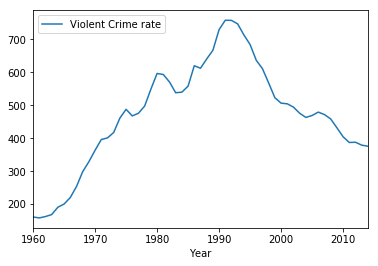

In [62]:

crime = us_crime.read()
print(type(crime))
crime.head()

crime.plot(x='Year', y='Violent Crime rate')


In [63]:
crime.hvplot.line(x='Year', y='Violent Crime rate')

:Curve   [Year]   (Violent Crime rate)

In [64]:
crime.hvplot(x='Year', y='Violent Crime rate', kind='scatter')


:Scatter   [Year]   (Violent Crime rate)

In [66]:
crime.hvplot(x='Year', y=['Violent Crime rate', 'Robbery rate', 'Burglary rate'],
               value_label='Rate (per 100k people)')

:NdOverlay   [Variable]
   :Curve   [Year]   (Rate (per 100k people))

In [26]:
columns = ['Burglary rate', 'Larceny-theft rate', 'Robbery rate', 'Violent Crime rate']

us_crime.plot.violin(y=columns, group_label='Type of crime', value_label='Rate per 100k', invert=True)

:Violin   [Type of crime]   (Rate per 100k)

In [27]:
us_crime.plot.bivariate('Burglary rate', 'Property crime rate', legend=False, width=500, height=400) * \
us_crime.plot.scatter(  'Burglary rate', 'Property crime rate', color='black', size=15, legend=False) +\
us_crime.plot.table(['Burglary rate', 'Property crime rate'], width=350, height=350)

:Layout
   .Overlay.I :Overlay
      .Bivariate.I :Bivariate   [Burglary rate,Property crime rate]   (Density)
      .Scatter.I   :Scatter   [Burglary rate]   (Property crime rate)
   .Table.I   :Table   [Burglary rate,Property crime rate]

In [30]:
# import hvplot.streamz
# from streamz.dataframe import Random

# streaming_df = Random(freq='5ms') 

# streaming_df.hvplot(backlog=100, height=400, width=500) +\
# streaming_df.hvplot.hexbin(x='x', y='z', backlog=2000, height=400, width=500);

In [98]:
import xarray as xr, hvplot.xarray, cartopy.crs as crs, geoviews as gv

air_ds = xr.tutorial.open_dataset('air_temperature').load()
proj = crs.Orthographic(-90, 30)

air_ds.air.isel(time=slice(0, 9, 3)).hvplot.quadmesh(
    'lon', 'lat', projection=proj, project=True, global_extent=True,
    width=600, height=540, cmap='viridis', rasterize=True, dynamic=False,
) * gv.feature.coastline

:HoloMap   [time]
   :Overlay
      .Image.I     :Image   [lon,lat]   (air)
      .Coastline.I :Feature   [Longitude,Latitude]

In [97]:
# from bokeh.sampledata.airpaaort_routes import airports

In [15]:
import networkx as nx
import hvplot.networkx as hvnx

G = nx.karate_club_graph()

hvnx.draw_spring(G, labels='club', font_size='10pt', node_color='club', cmap='Category10', width=500, height=500)

:Overlay
   .Graph.I  :Graph   [start,end]
   .Labels.I :Labels   [x,y]   (club)